In [1]:
!pip install mediapipe

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 30.3 MB/s eta 0:00:00


In [2]:
import numpy as np
import os,cv2,math,glob,random
import scipy.io as sio
from math import cos, sin
from pathlib import Path
import pandas as pd
import mediapipe as mp
import warnings
warnings.filterwarnings('ignore')
from google.colab.patches import cv2_imshow

In [3]:
!wget http://www.cbsr.ia.ac.cn/users/xiangyuzhu/projects/3DDFA/Database/AFLW2000-3D.zip

--2024-03-10 10:23:49--  http://www.cbsr.ia.ac.cn/users/xiangyuzhu/projects/3DDFA/Database/AFLW2000-3D.zip
Resolving www.cbsr.ia.ac.cn (www.cbsr.ia.ac.cn)... 159.226.21.60
Connecting to www.cbsr.ia.ac.cn (www.cbsr.ia.ac.cn)|159.226.21.60|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87413900 (83M) [application/x-zip-compressed]
Saving to: ‘AFLW2000-3D.zip’

AFLW2000-3D.zip     100%[===================>]  83.36M   312KB/s    in 4m 40s  

2024-03-10 10:28:30 (305 KB/s) - ‘AFLW2000-3D.zip’ saved [87413900/87413900]



In [4]:
!unzip '/content/AFLW2000-3D.zip'

Archive:  /content/AFLW2000-3D.zip
   creating: AFLW2000/
   creating: AFLW2000/Code/
  inflating: AFLW2000/Code/DrawSolidHead.m  
  inflating: AFLW2000/Code/DrawTextureHead.m  
  inflating: AFLW2000/Code/main_show_without_BFM.m  
  inflating: AFLW2000/Code/main_show_with_BFM.m  
   creating: AFLW2000/Code/Mex/
  inflating: AFLW2000/Code/Mex/compile.m  
  inflating: AFLW2000/Code/Mex/Tnorm_Vnorm.h  
  inflating: AFLW2000/Code/Mex/Tnorm_VnormC.cpp  
  inflating: AFLW2000/Code/Mex/Tnorm_VnormC.mexw64  
   creating: AFLW2000/Code/ModelGeneration/
  inflating: AFLW2000/Code/ModelGeneration/ModelGenerate.m  
  inflating: AFLW2000/Code/ModelGeneration/model_info.mat  
  inflating: AFLW2000/Code/Model_Exp.mat  
  inflating: AFLW2000/Code/Model_Shape_Sim.mat  
  inflating: AFLW2000/Code/NormDirection.m  
  inflating: AFLW2000/Code/readme.txt  
  inflating: AFLW2000/Code/RotationMatrix.m  
  inflating: AFLW2000/Code/Tnorm_VnormC.mexw64  
  inflating: AFLW2000/image00002.jpg  
  inflating: AFLW2

In [5]:
files = os.listdir('/content/AFLW2000')
files.sort()

Data Preprocessing

In [6]:
jpg_files = [i for i in files if len(i.split('.')) > 1 and i.split('.')[1] == 'jpg']
mat_files = [i for i in files if len(i.split('.')) > 1 and i.split('.')[1] == 'mat']

In [7]:
x_points = []
y_points = []
labels = []
imgs = []

face_mesh_1 = mp.solutions.face_mesh

# iterate over files
for img_path, mat_path in zip(jpg_files, mat_files):
    img = cv2.imread('/content/AFLW2000/' + img_path)
    mat = sio.loadmat('/content/AFLW2000/' + mat_path)

    # create face mesh object
    with face_mesh_1.FaceMesh(static_image_mode=True) as face_mesh:
        # process image for the face_mesh model
        results = face_mesh.process(img[:,:,::-1])

        # check if face landmarks were detected
        if results.multi_face_landmarks:
            X_t = []
            y_t = []
            face_landmark = results.multi_face_landmarks[0]
            # save image name
            imgs.append(img_path)
            # get face landmarks for all detected faces
            for landmark in face_landmark.landmark:
                # get landmark coordinates and add to landmarks list
                shape = img.shape
                # X and Y features
                X_t.append(int(landmark.x * shape[1]))
                y_t.append(int(landmark.y * shape[0]))

            # add landmarks to feature array and pose parameters to label array
            x_points.append(X_t)
            y_points.append(y_t)

            # labels
            pose_para = mat['Pose_Para'][0][:3]
            labels.append(pose_para)

# convert feature and label arrays to numpy arrays
X = np.array(x_points)
y = np.array(y_points)
labels = np.array(labels)
imgs = np.array(imgs)


# pitch label
pitch_label = labels[:,0]
# yaw label
yaw_label = labels[:,1]
# roll label
roll_label = labels[:,2]

# check shapes
print(X.shape)
print(y.shape)
print(labels.shape)
print(imgs.shape)

(1853, 468)
(1853, 468)
(1853, 3)
(1853,)


Feature Extraction

In [8]:
def draw_axis(img, pitch, yaw, roll, tdx=None, tdy=None, size = 100):

    yaw = -yaw
    if tdx != None and tdy != None:
        tdx = tdx
        tdy = tdy
    else:
        height, width = img.shape[:2]
        tdx = width / 2
        tdy = height / 2

    # X-Axis pointing to right. drawn in red
    x1 = size * (cos(yaw) * cos(roll)) + tdx
    y1 = size * (cos(pitch) * sin(roll) + cos(roll) * sin(pitch) * sin(yaw)) + tdy

    # Y-Axis | drawn in green
    #        v
    x2 = size * (-cos(yaw) * sin(roll)) + tdx
    y2 = size * (cos(pitch) * cos(roll) - sin(pitch) * sin(yaw) * sin(roll)) + tdy

    # Z-Axis (out of the screen) drawn in blue
    x3 = size * (sin(yaw)) + tdx
    y3 = size * (-cos(yaw) * sin(pitch)) + tdy

    cv2.line(img, (int(tdx), int(tdy)), (int(x1),int(y1)),(0,0,255),3)
    cv2.line(img, (int(tdx), int(tdy)), (int(x2),int(y2)),(0,255,0),3)
    cv2.line(img, (int(tdx), int(tdy)), (int(x3),int(y3)),(255,0,0),2)

    return img

In [9]:
# Calculate distances between key points for feature extraction
x_center = X - X[:,1].reshape(-1,1)
y_center = y - y[:,1].reshape(-1,1)

# Normalization
X_chain = X[:,152]
X_forehead = X[:,10]
y_chain = y[:,152]
y_forehead = y[:,10]
distance = np.linalg.norm(np.array((X_forehead,y_forehead)) - np.array((X_chain,y_chain)),axis = 0).reshape(-1,1)
Norm_x = x_center / distance
Norm_y = y_center / distance
final_x = Norm_x
final_y = Norm_y
features = np.hstack([final_x,final_y])

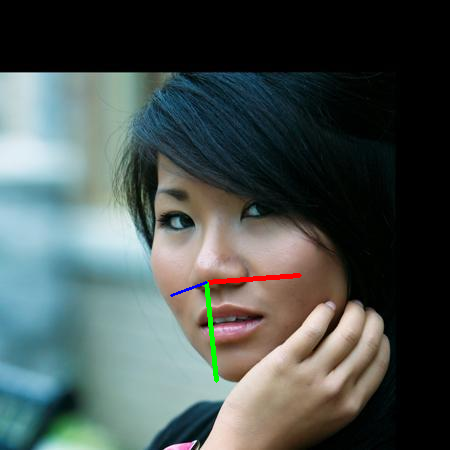

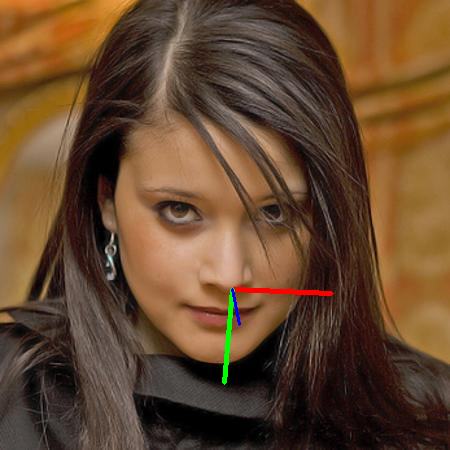

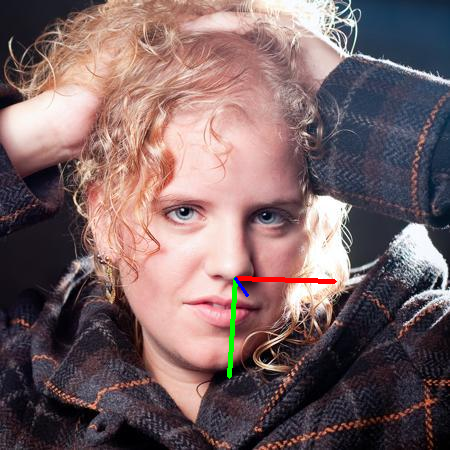

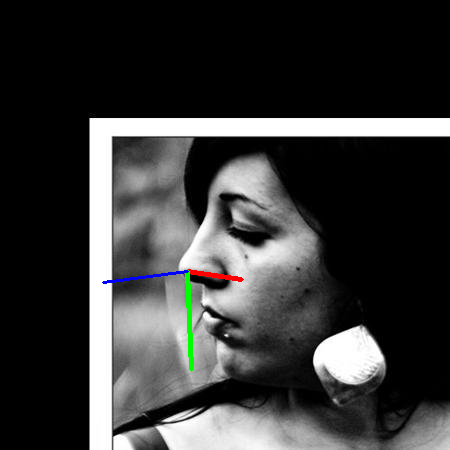

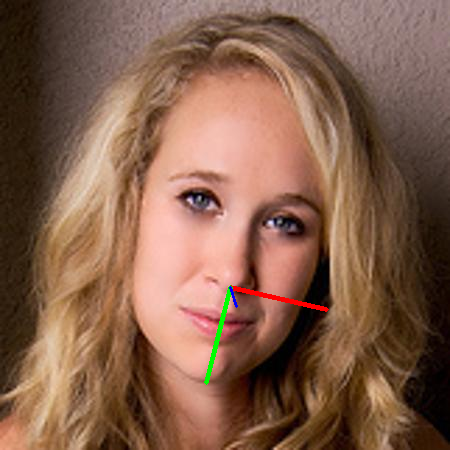

In [10]:
for i in range(200, 205):
    img = cv2.imread('/content/AFLW2000/' + imgs[i])

    pitch_angle = labels[i][0]
    yaw_angle = labels[i][1]
    roll_angle = labels[i][2]

    tdx = X[:, 1][i]
    tdy = y[:, 1][i]

    result_img = draw_axis(img, pitch_angle, yaw_angle, roll_angle, tdx, tdy)
    cv2_imshow(result_img)

Model Building, Evaluation & Improvement

In [11]:
# Split the dataset into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(features, labels, random_state=42, test_size=0.1, shuffle=True)

y_train_pitch = y_train[:,0]
y_test_pitch = y_test[:,0]

y_train_yaw = y_train[:,1]
y_test_yaw = y_test[:,1]

y_train_roll = y_train[:,2]
y_test_roll = y_test[:,2]

Ridge

In [12]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

In [30]:
# parameter grid of Ridge regression
param_grid = {'alpha': [0.001, 0.01, 0.1, 1, 10, 100]}

# Grid search for pitch model
pitch_ridge = Ridge()
pitch_grid_search = GridSearchCV(pitch_ridge, param_grid, cv=5)
pitch_grid_search.fit(X_train, y_train_pitch)
print("Best alpha for pitch model:", pitch_grid_search.best_params_)


# Grid search for yaw model
yaw_ridge = Ridge()
yaw_grid_search = GridSearchCV(yaw_ridge, param_grid, cv=5)
yaw_grid_search.fit(X_train, y_train_yaw)
print("Best alpha for yaw model:", yaw_grid_search.best_params_)


# Grid search for roll model
roll_ridge = Ridge()
roll_grid_search = GridSearchCV(roll_ridge, param_grid, cv=5)
roll_grid_search.fit(X_train, y_train_roll)
print("Best alpha for roll model:", roll_grid_search.best_params_)

Best alpha for pitch model: {'alpha': 10}
Best alpha for yaw model: {'alpha': 0.1}
Best alpha for roll model: {'alpha': 100}


In [13]:
# Train Models with the best alphas

pitch_ridge_model = Ridge(alpha=10)
pitch_ridge_model.fit(X_train, y_train_pitch)

yaw_ridge_model = Ridge(alpha=0.1)
yaw_ridge_model.fit(X_train, y_train_yaw)

roll_ridge_model = Ridge(alpha=100)
roll_ridge_model.fit(X_train, y_train_roll)

Ridge(alpha=100)

In [14]:
# Evaluation
pitch_score = pitch_ridge_model.score(X_test, y_test_pitch)
yaw_score = yaw_ridge_model.score(X_test, y_test_yaw)
roll_score = roll_ridge_model.score(X_test, y_test_roll)

print("Pitch model score:", pitch_score)
print("Yaw model score:", yaw_score)
print("Roll model score:", roll_score)

Pitch model score: 0.7464843660959799
Yaw model score: 0.9674729533591612
Roll model score: 0.7677638886397493


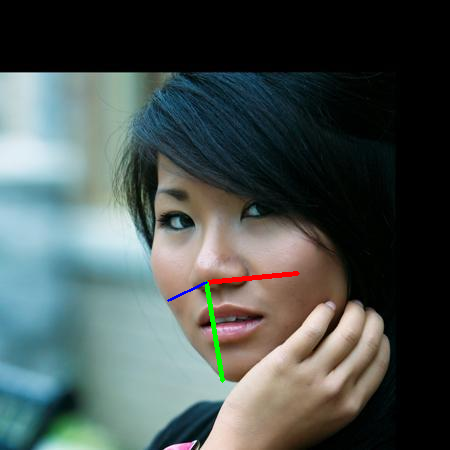

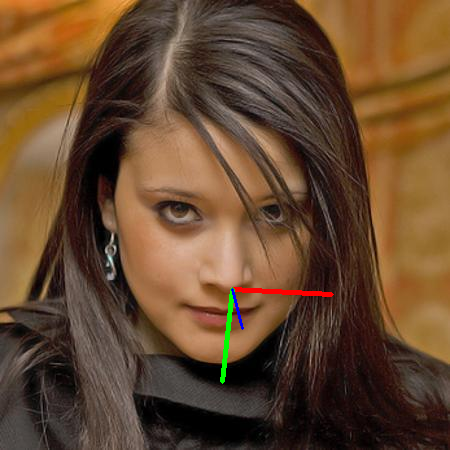

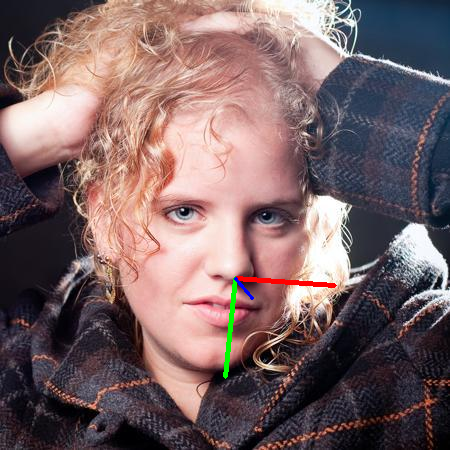

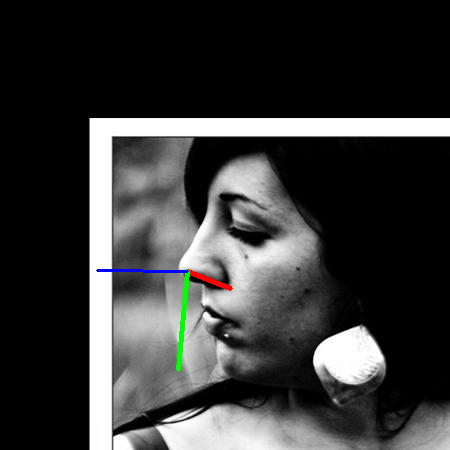

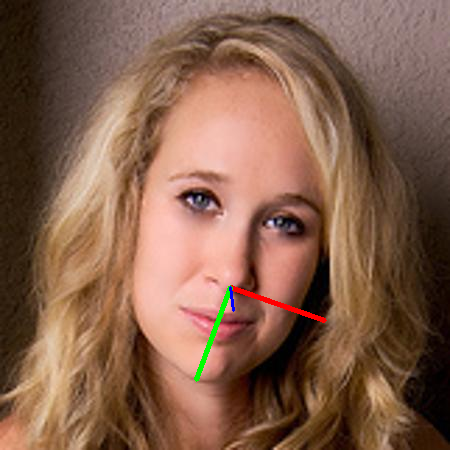

In [15]:
test_img_paths = ['/content/AFLW2000/' + img for img in imgs[200:205]]

# Loop through each test image path
for test_img_path in test_img_paths:
    test_img = cv2.imread(test_img_path)

    # Extract facial landmark points for the test image
    with face_mesh_1.FaceMesh(static_image_mode=True) as face_mesh:
        results = face_mesh.process(test_img[:,:,::-1])
        if results.multi_face_landmarks:
            face_landmark = results.multi_face_landmarks[0]

            # Extract X and Y coordinates of facial landmarks
            X_test_t = []
            y_test_t = []
            for i, landmark in enumerate(face_landmark.landmark):
                shape = test_img.shape
                # centralize axises according to face not picture (using nose position in mediapipe)
                if i == 1:
                    nose = (landmark.x, landmark.y)
                X_test_t.append(int(landmark.x * shape[1]))
                y_test_t.append(int(landmark.y * shape[0]))

            # Normalize the features
            x_test_center = np.array(X_test_t) - X_test_t[1]
            y_test_center = np.array(y_test_t) - y_test_t[1]
            distance_test = np.linalg.norm(np.array((X_test_t[10], y_test_t[10])) - np.array((X_test_t[152], y_test_t[152])))
            norm_x_test = x_test_center / distance_test
            norm_y_test = y_test_center / distance_test
            final_x_test = norm_x_test.reshape(1, -1)
            final_y_test = norm_y_test.reshape(1, -1)
            features_test = np.hstack([final_x_test, final_y_test])

            # Predict pitch, yaw, and roll angles using trained regression models
            pitch_pred = pitch_ridge_model.predict(features_test)[0]
            yaw_pred = yaw_ridge_model.predict(features_test)[0]
            roll_pred = roll_ridge_model.predict(features_test)[0]

            result_img = draw_axis(test_img, pitch_pred, yaw_pred, roll_pred, nose[0]*test_img.shape[1], nose[1]*test_img.shape[0])
            cv2_imshow(result_img)


AdaBoost Regressor

In [16]:
from sklearn.ensemble import AdaBoostRegressor

In [21]:
# parameter grid of AdaBoostRegressor
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1.0]
}


pitch_adaboost = AdaBoostRegressor()
pitch_grid_search = GridSearchCV(pitch_adaboost, param_grid, cv=5)
pitch_grid_search.fit(X_train, y_train_pitch)
print("Best parameters for pitch model:", pitch_grid_search.best_params_)


yaw_adaboost = AdaBoostRegressor()
yaw_grid_search = GridSearchCV(yaw_adaboost, param_grid, cv=5)
yaw_grid_search.fit(X_train, y_train_yaw)
print("Best parameters for yaw model:", yaw_grid_search.best_params_)


roll_adaboost = AdaBoostRegressor()
roll_grid_search = GridSearchCV(roll_adaboost, param_grid, cv=5)
roll_grid_search.fit(X_train, y_train_roll)
print("Best parameters for roll model:", roll_grid_search.best_params_)

Best parameters for pitch model: {'learning_rate': 0.01, 'n_estimators': 50}
Best parameters for yaw model: {'learning_rate': 0.01, 'n_estimators': 50}
Best parameters for roll model: {'learning_rate': 0.01, 'n_estimators': 50}


In [22]:
# Train models with best parameters

pitch_ada_model = AdaBoostRegressor(n_estimators= 50, learning_rate= 0.01)
pitch_ada_model.fit(X_train, y_train_pitch)

yaw_ada_model = AdaBoostRegressor(n_estimators= 50, learning_rate= 0.01)
yaw_ada_model.fit(X_train, y_train_yaw)

roll_ada_model = AdaBoostRegressor(n_estimators= 50, learning_rate= 0.01)
roll_ada_model.fit(X_train, y_train_roll)

AdaBoostRegressor(learning_rate=0.01)

In [23]:
# Evaluation
pitch_score = pitch_ada_model.score(X_test, y_test_pitch)
yaw_score = yaw_ada_model.score(X_test, y_test_yaw)
roll_score = roll_ada_model.score(X_test, y_test_roll)

print("Pitch model score:", pitch_score)
print("Yaw model score:", yaw_score)
print("Roll model score:", roll_score)

Pitch model score: 0.5036003150354633
Yaw model score: 0.9395921015623567
Roll model score: -23.668673158351012


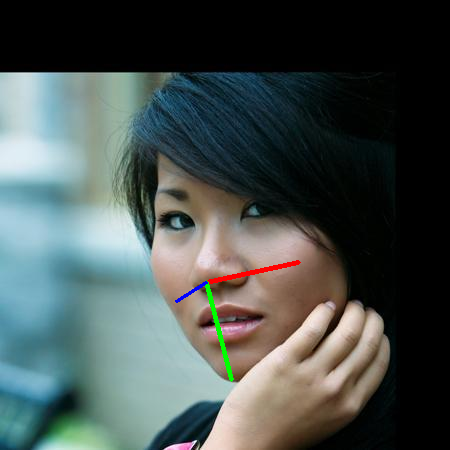

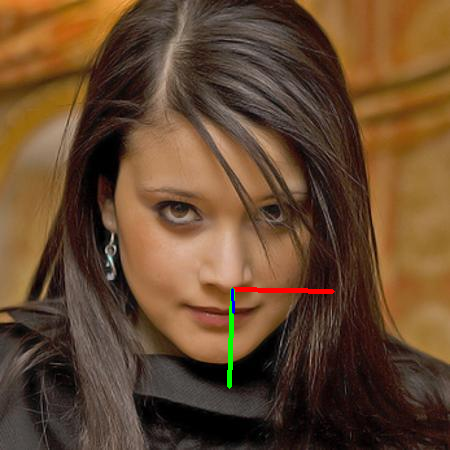

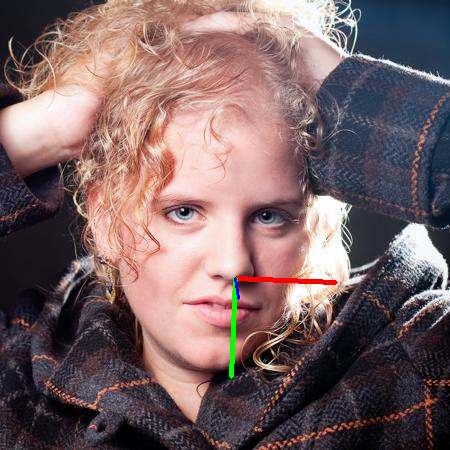

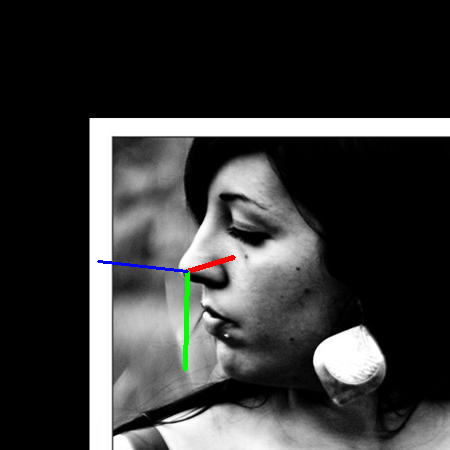

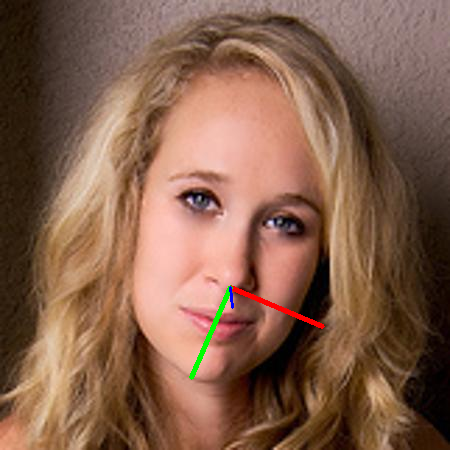

In [24]:
# Define a list of test image paths
test_img_paths = ['/content/AFLW2000/' + img for img in imgs[200:205]]  # Adjust the range as needed

# Loop through each test image path
for test_img_path in test_img_paths:
    test_img = cv2.imread(test_img_path)

    # Extract facial landmark points for the test image
    with face_mesh_1.FaceMesh(static_image_mode=True) as face_mesh:
        results = face_mesh.process(test_img[:,:,::-1])
        if results.multi_face_landmarks:
            face_landmark = results.multi_face_landmarks[0]

            # Extract X and Y coordinates of facial landmarks
            X_test_t = []
            y_test_t = []
            for i, landmark in enumerate(face_landmark.landmark):
                shape = test_img.shape
                # centralize axises according to face not picture (using nose position in mediapipe)
                if i == 1:
                    nose = (landmark.x, landmark.y)
                X_test_t.append(int(landmark.x * shape[1]))
                y_test_t.append(int(landmark.y * shape[0]))

            # Normalize the features
            x_test_center = np.array(X_test_t) - X_test_t[1]
            y_test_center = np.array(y_test_t) - y_test_t[1]
            distance_test = np.linalg.norm(np.array((X_test_t[10], y_test_t[10])) - np.array((X_test_t[152], y_test_t[152])))
            norm_x_test = x_test_center / distance_test
            norm_y_test = y_test_center / distance_test
            final_x_test = norm_x_test.reshape(1, -1)
            final_y_test = norm_y_test.reshape(1, -1)
            features_test = np.hstack([final_x_test, final_y_test])

            # Predict pitch, yaw, and roll angles using trained regression models
            pitch_pred = pitch_ada_model.predict(features_test)[0]
            yaw_pred = yaw_ada_model.predict(features_test)[0]
            roll_pred = roll_ada_model.predict(features_test)[0]

            # Visualize the predicted angles on the image
            result_img = draw_axis(test_img, pitch_pred, yaw_pred, roll_pred, nose[0]*test_img.shape[1], nose[1]*test_img.shape[0])
            cv2_imshow(result_img)


XGBoost Regressor

In [25]:
from xgboost import XGBRegressor

params = {
    'learning_rate': 0.1,
    'n_estimators': 200,
    'max_depth': 4,
    'min_child_weight': 1,
    'gamma': 0,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'reg_alpha': 0,
    'reg_lambda': 1
}

pitch_xgb_model = XGBRegressor(**params)
pitch_xgb_model.fit(X_train, y_train_pitch)

yaw_xgb_model = XGBRegressor(**params)
yaw_xgb_model.fit(X_train, y_train_yaw)

roll_xgb_model = XGBRegressor(**params)
roll_xgb_model.fit(X_train, y_train_roll)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=1, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=200, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [26]:
# Evaluation
pitch_score = pitch_xgb_model.score(X_test, y_test_pitch)
yaw_score = yaw_xgb_model.score(X_test, y_test_yaw)
roll_score = roll_xgb_model.score(X_test, y_test_roll)

print("Pitch model score:", pitch_score)
print("Yaw model score:", yaw_score)
print("Roll model score:", roll_score)

Pitch model score: 0.20098334533471596
Yaw model score: 0.8862146287816071
Roll model score: -4.987561376241919


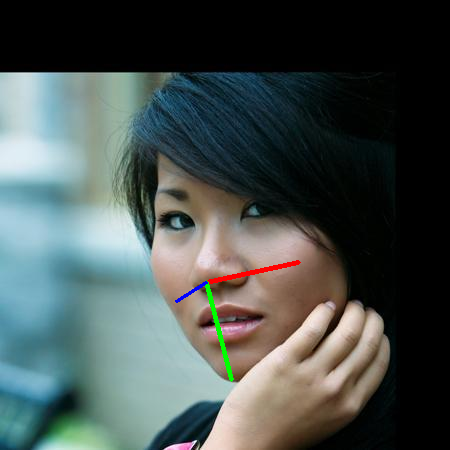

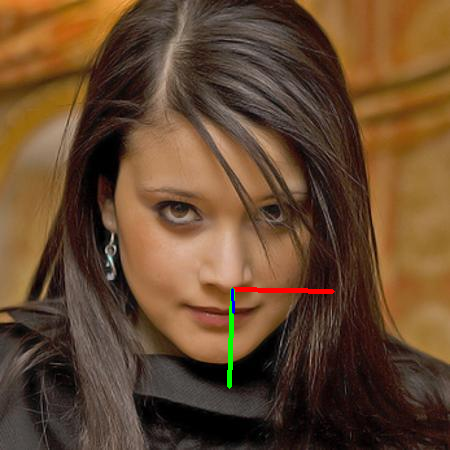

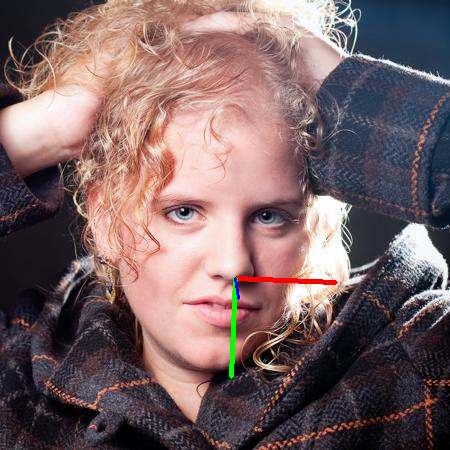

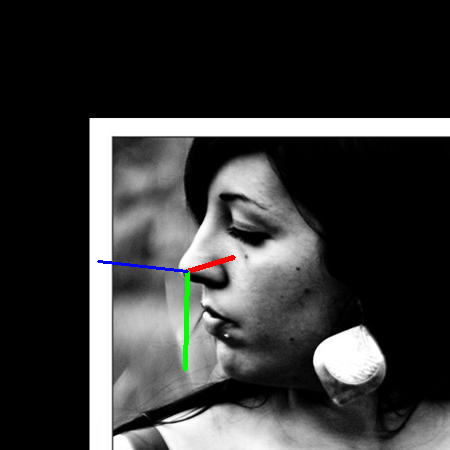

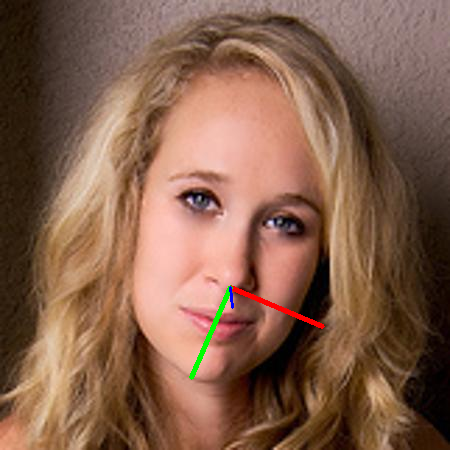

In [27]:
test_img_paths = ['/content/AFLW2000/' + img for img in imgs[200:205]]

# Loop through each test image path
for test_img_path in test_img_paths:
    test_img = cv2.imread(test_img_path)

    # Extract facial landmark points for the test image
    with face_mesh_1.FaceMesh(static_image_mode=True) as face_mesh:
        results = face_mesh.process(test_img[:,:,::-1])
        if results.multi_face_landmarks:
            face_landmark = results.multi_face_landmarks[0]

            # Extract X and Y coordinates of facial landmarks
            X_test_t = []
            y_test_t = []
            for i, landmark in enumerate(face_landmark.landmark):
                shape = test_img.shape
                # centralize axises according to face not picture (using nose position in mediapipe)
                if i == 1:
                    nose = (landmark.x, landmark.y)
                X_test_t.append(int(landmark.x * shape[1]))
                y_test_t.append(int(landmark.y * shape[0]))

            # Normalize the features
            x_test_center = np.array(X_test_t) - X_test_t[1]
            y_test_center = np.array(y_test_t) - y_test_t[1]
            distance_test = np.linalg.norm(np.array((X_test_t[10], y_test_t[10])) - np.array((X_test_t[152], y_test_t[152])))
            norm_x_test = x_test_center / distance_test
            norm_y_test = y_test_center / distance_test
            final_x_test = norm_x_test.reshape(1, -1)
            final_y_test = norm_y_test.reshape(1, -1)
            features_test = np.hstack([final_x_test, final_y_test])

            # Predict pitch, yaw, and roll angles using trained regression models
            pitch_pred = pitch_ada_model.predict(features_test)[0]
            yaw_pred = yaw_ada_model.predict(features_test)[0]
            roll_pred = roll_ada_model.predict(features_test)[0]

            result_img = draw_axis(test_img, pitch_pred, yaw_pred, roll_pred, nose[0]*test_img.shape[1], nose[1]*test_img.shape[0])
            cv2_imshow(result_img)


SVR

In [29]:
from sklearn.svm import SVR

In [46]:
# parameter grid of SVR
param_grid = {
    'kernel': ['linear', 'poly', 'rbf'],
    'C': [0.1, 1, 10],
    'gamma': ['scale', 'auto'],
    'epsilon': [0.1, 0.2, 0.5]
}


pitch_svr = SVR()
pitch_grid_search = GridSearchCV(pitch_svr, param_grid, cv=5)
pitch_grid_search.fit(X_train, y_train_pitch)
print("Best parameters for pitch model:", pitch_grid_search.best_params_)


yaw_svr = SVR()
yaw_grid_search = GridSearchCV(yaw_svr, param_grid, cv=5)
yaw_grid_search.fit(X_train, y_train_yaw)
print("Best parameters for yaw model:", yaw_grid_search.best_params_)


roll_svr = SVR()
roll_grid_search = GridSearchCV(roll_svr, param_grid, cv=5)
roll_grid_search.fit(X_train, y_train_roll)
print("Best parameters for roll model:", roll_grid_search.best_params_)

Best parameters for pitch model: {'C': 10, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'poly'}
Best parameters for yaw model: {'C': 10, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'poly'}
Best parameters for roll model: {'C': 10, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'rbf'}


In [32]:
# train the model with the best parameters
pitch_svr_model = SVR(kernel= 'poly', C= 10, gamma= 'scale', epsilon= 0.1)
pitch_svr_model.fit(X_train, y_train_pitch)

yaw_svr_model = SVR(kernel= 'poly', C= 10, gamma= 'scale', epsilon= 0.1)
yaw_svr_model.fit(X_train, y_train_yaw)

roll_svr_model = SVR(kernel= 'rbf', C= 10, gamma= 'scale', epsilon= 0.1)
roll_svr_model.fit(X_train, y_train_roll)

SVR(C=10)

In [33]:
# Evaluation
pitch_score = pitch_svr_model.score(X_test, y_test_pitch)
yaw_score = yaw_svr_model.score(X_test, y_test_yaw)
roll_score = roll_svr_model.score(X_test, y_test_roll)

print("Pitch model score:", pitch_score)
print("Yaw model score:", yaw_score)
print("Roll model score:", roll_score)

Pitch model score: 0.829444206046674
Yaw model score: 0.975212294333317
Roll model score: 0.9085057244133932


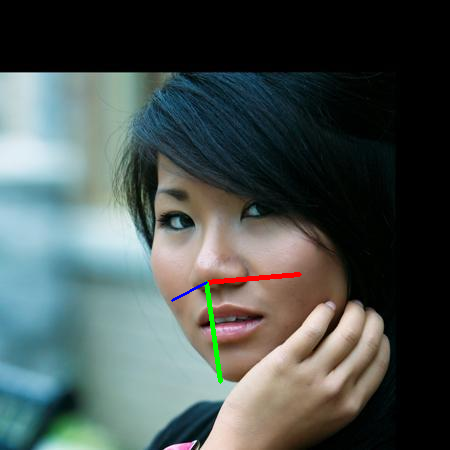

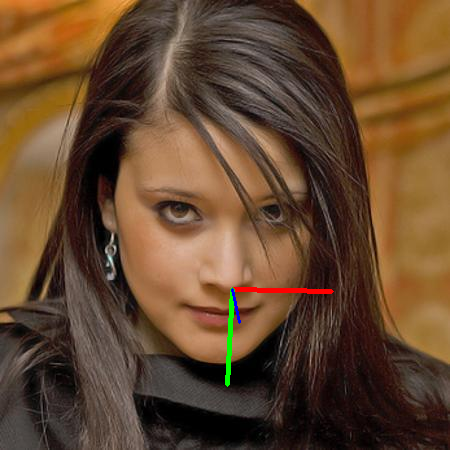

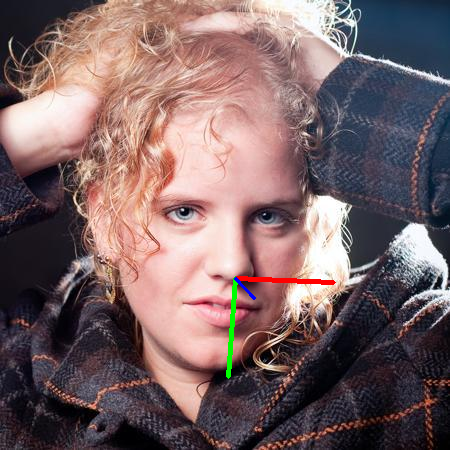

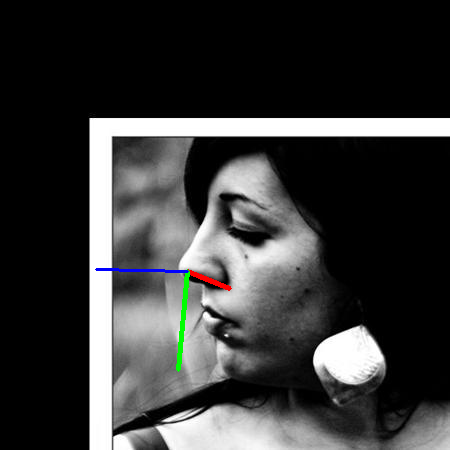

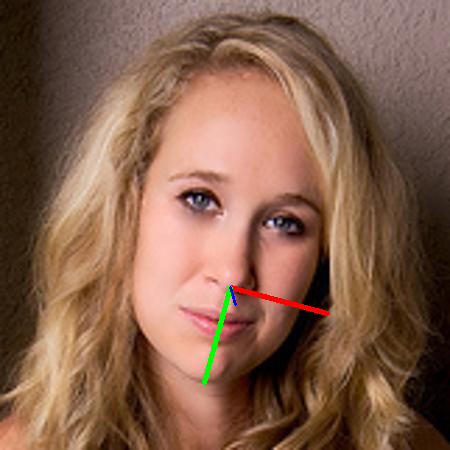

In [34]:
test_img_paths = ['/content/AFLW2000/' + img for img in imgs[200:205]]

# Loop through each test image path
for test_img_path in test_img_paths:
    test_img = cv2.imread(test_img_path)

    # Extract facial landmark points for the test image
    with face_mesh_1.FaceMesh(static_image_mode=True) as face_mesh:
        results = face_mesh.process(test_img[:,:,::-1])
        if results.multi_face_landmarks:
            face_landmark = results.multi_face_landmarks[0]

            # Extract X and Y coordinates of facial landmarks
            X_test_t = []
            y_test_t = []
            for i, landmark in enumerate(face_landmark.landmark):
                shape = test_img.shape
                # centralize axises according to face not picture (using nose position in mediapipe)
                if i == 1:
                    nose = (landmark.x, landmark.y)
                X_test_t.append(int(landmark.x * shape[1]))
                y_test_t.append(int(landmark.y * shape[0]))

            # Normalize the features
            x_test_center = np.array(X_test_t) - X_test_t[1]
            y_test_center = np.array(y_test_t) - y_test_t[1]
            distance_test = np.linalg.norm(np.array((X_test_t[10], y_test_t[10])) - np.array((X_test_t[152], y_test_t[152])))
            norm_x_test = x_test_center / distance_test
            norm_y_test = y_test_center / distance_test
            final_x_test = norm_x_test.reshape(1, -1)
            final_y_test = norm_y_test.reshape(1, -1)
            features_test = np.hstack([final_x_test, final_y_test])

            # Predict pitch, yaw, and roll angles using trained regression models
            pitch_pred = pitch_svr_model.predict(features_test)[0]
            yaw_pred = yaw_svr_model.predict(features_test)[0]
            roll_pred = roll_svr_model.predict(features_test)[0]

            result_img = draw_axis(test_img, pitch_pred, yaw_pred, roll_pred, nose[0]*test_img.shape[1], nose[1]*test_img.shape[0])
            cv2_imshow(result_img)


Best Accuracy is SVR's one

Image Prediction

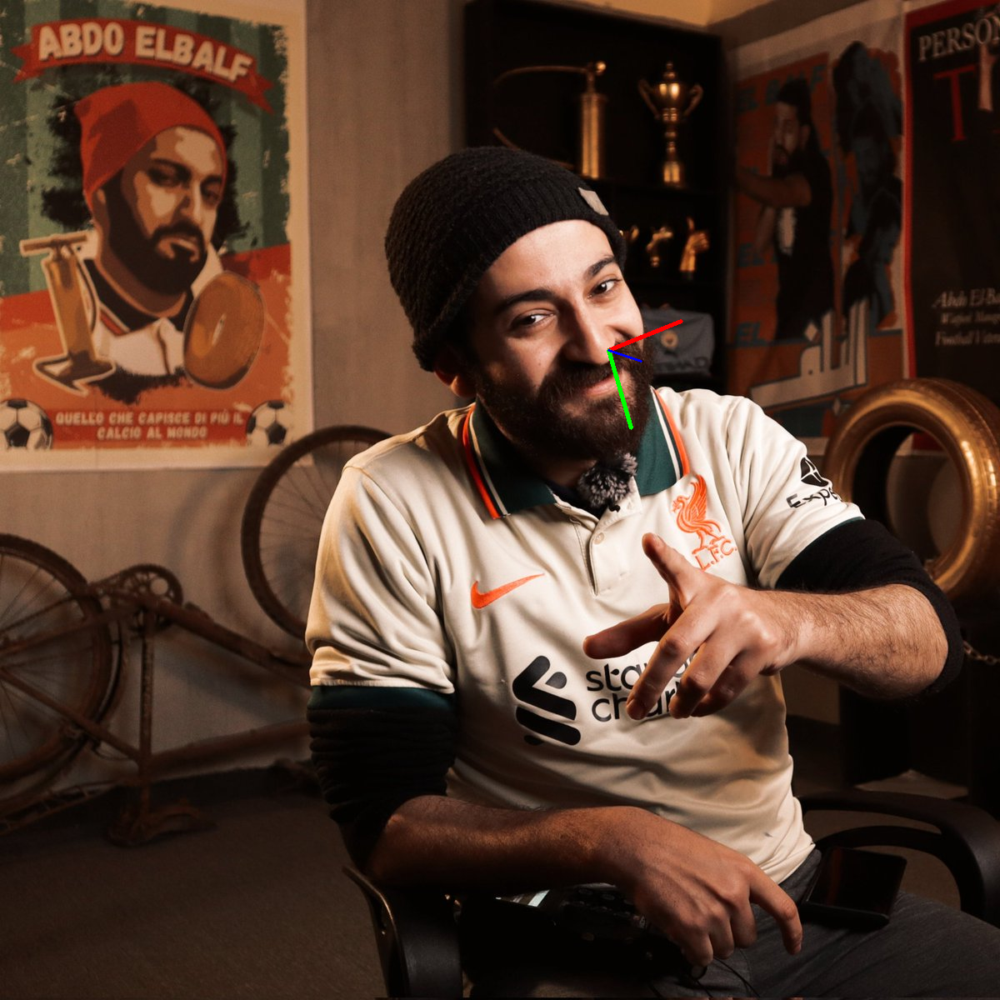

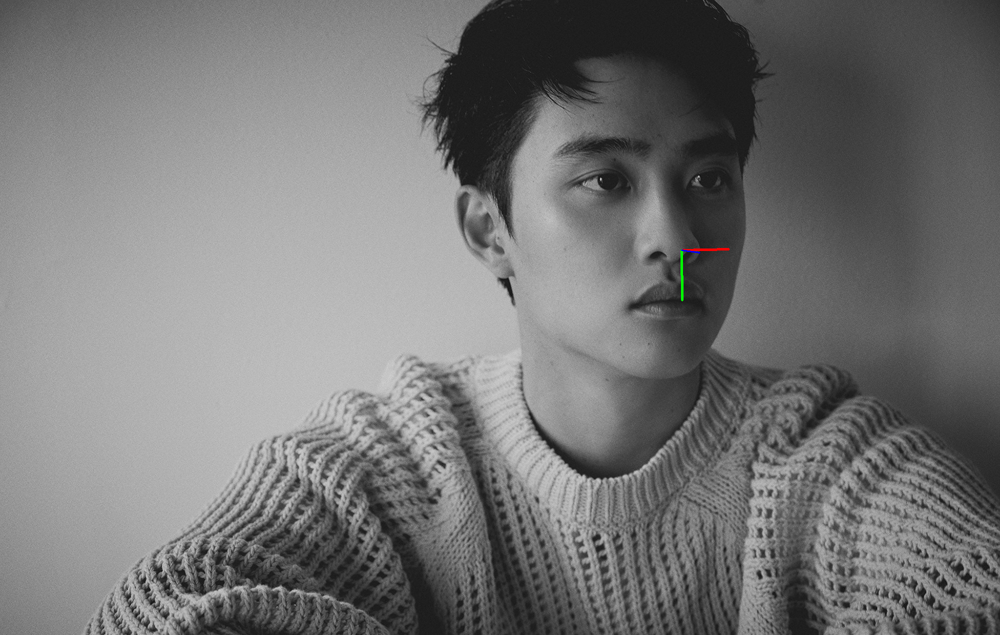

In [54]:
# Define a list of test image paths
test_img_paths = [
                  '/content/drive/MyDrive/MLSupervisedProject/elostaabdo.jpeg',
                  '/content/drive/MyDrive/MLSupervisedProject/kyungsoo.jpeg'
                 ]

# Loop through each test image path
for test_img_path in test_img_paths:
    test_img = cv2.imread(test_img_path)

    # Extract facial landmark points for the test image
    with face_mesh_1.FaceMesh(static_image_mode=True) as face_mesh:
        results = face_mesh.process(test_img[:,:,::-1])
        if results.multi_face_landmarks:
            face_landmark = results.multi_face_landmarks[0]

            # Extract X and Y coordinates of facial landmarks
            X_test_t = []
            y_test_t = []
            for i, landmark in enumerate(face_landmark.landmark):
                shape = test_img.shape
                # centralize axises according to face not picture (using nose position in mediapipe)
                if i == 1:
                    nose = (landmark.x, landmark.y)
                X_test_t.append(int(landmark.x * shape[1]))
                y_test_t.append(int(landmark.y * shape[0]))

            # Normalize the features
            x_test_center = np.array(X_test_t) - X_test_t[1]
            y_test_center = np.array(y_test_t) - y_test_t[1]
            distance_test = np.linalg.norm(np.array((X_test_t[10], y_test_t[10])) - np.array((X_test_t[152], y_test_t[152])))
            norm_x_test = x_test_center / distance_test
            norm_y_test = y_test_center / distance_test
            final_x_test = norm_x_test.reshape(1, -1)
            final_y_test = norm_y_test.reshape(1, -1)
            features_test = np.hstack([final_x_test, final_y_test])

            # Predict pitch, yaw, and roll angles using trained regression models
            pitch_pred = pitch_svr_model.predict(features_test)[0]
            yaw_pred = yaw_svr_model.predict(features_test)[0]
            roll_pred = roll_svr_model.predict(features_test)[0]

            # Visualize the predicted angles on the image
            result_img = draw_axis(test_img, pitch_pred, yaw_pred, roll_pred, nose[0]*test_img.shape[1], nose[1]*test_img.shape[0])
            cv2_imshow(result_img)


Video Prediction

In [39]:
face_mesh_1 = mp.solutions.face_mesh

cap = cv2.VideoCapture('/content/drive/MyDrive/MLSupervisedProject/Input_Video.mp4')

output_video_path = '/content/drive/MyDrive/MLSupervisedProject/Output_Video.avi'

# Get the video frame properties
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

# Define the video writer object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

# Loop through each frame of the video
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Extract facial landmark points for the frame
    with face_mesh_1.FaceMesh(static_image_mode=True) as face_mesh:
        results = face_mesh.process(frame[:,:,::-1])
        if results.multi_face_landmarks:
            face_landmark = results.multi_face_landmarks[0]

            # Extract X and Y coordinates of facial landmarks
            X_test_t = []
            y_test_t = []
            for i, landmark in enumerate(face_landmark.landmark):
                shape = frame.shape
                # centralize axises according to face not picture (using nose position in mediapipe)
                if i == 1:
                    nose = (landmark.x, landmark.y)
                X_test_t.append(int(landmark.x * shape[1]))
                y_test_t.append(int(landmark.y * shape[0]))

            # Normalize the features
            x_test_center = np.array(X_test_t) - X_test_t[1]
            y_test_center = np.array(y_test_t) - y_test_t[1]
            distance_test = np.linalg.norm(np.array((X_test_t[10], y_test_t[10])) - np.array((X_test_t[152], y_test_t[152])))
            norm_x_test = x_test_center / distance_test
            norm_y_test = y_test_center / distance_test
            final_x_test = norm_x_test.reshape(1, -1)
            final_y_test = norm_y_test.reshape(1, -1)
            features_test = np.hstack([final_x_test, final_y_test])

            # Predict pitch, yaw, and roll angles using trained regression models
            pitch_pred = pitch_svr_model.predict(features_test)[0]
            yaw_pred = yaw_svr_model.predict(features_test)[0]
            roll_pred = roll_svr_model.predict(features_test)[0]

            result_img = draw_axis(frame, pitch_pred, yaw_pred, roll_pred, nose[0]*frame.shape[1], nose[1]*frame.shape[0])

            # Write the frame with predicted angles to the output video
            out.write(result_img)

cap.release()
out.release()
cv2.destroyAllWindows()